<a href="https://colab.research.google.com/github/Fahrizp24/PCVK_Ganjil_2025/blob/main/Pertemuan3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

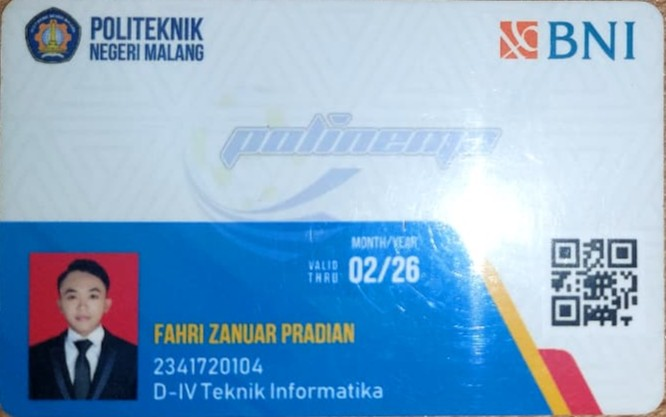

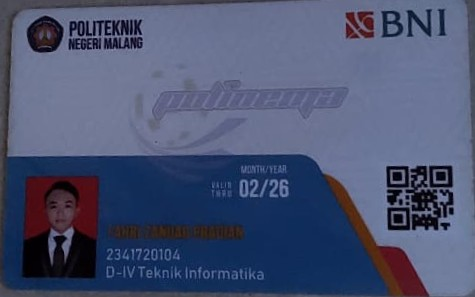

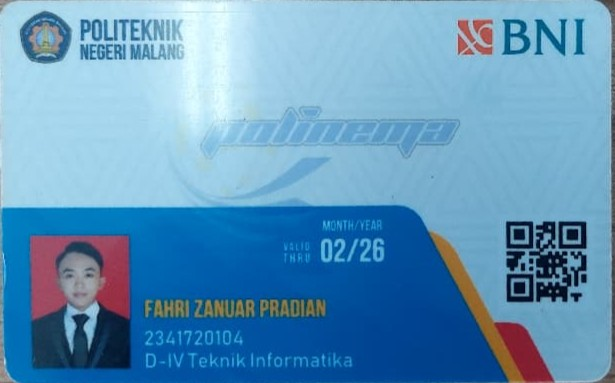

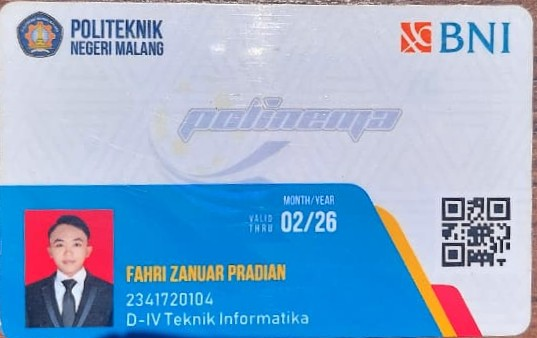

In [5]:
ktm_flash = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/ktm flash.jpg')
ktm_gelap = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/ktm gelap.jpg')
ktm_lampu = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/ktm lampu.jpg')
ktm_matahari = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/ktm matahari.jpg')

cv2_imshow(ktm_flash)
cv2_imshow(ktm_gelap)
cv2_imshow(ktm_lampu)
cv2_imshow(ktm_matahari)

Mengubah tingkat kecerahan citra
-------------------------------
Masukkan nilai kecerahan: 50


/tmp/ipython-input-2414931144.py:30: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


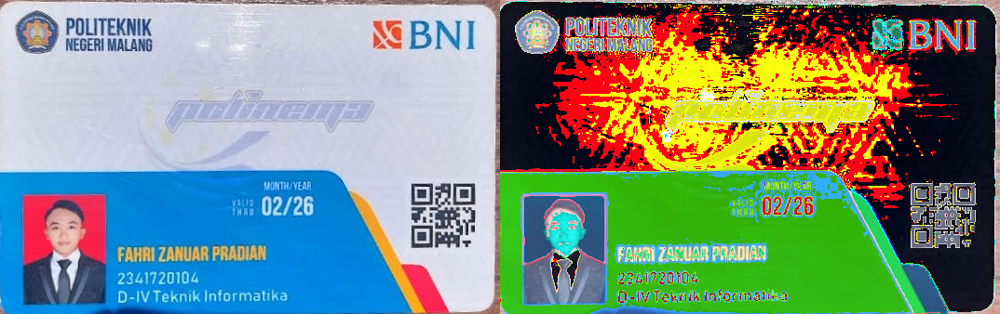

In [6]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Mengubah tingkat kecerahan citra
print('Mengubah tingkat kecerahan citra')
print('-------------------------------')

try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

# Membaca gambar dari direktori Google Drive
# original = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/female.tiff')
original = ktm_matahari.copy()
# Pastikan gambar berhasil dimuat
if original is None:
    print("Error: Gambar tidak ditemukan. Pastikan path file sudah benar.")
else:
    # Buat salinan gambar untuk menyimpan hasil transformasi
    brightness_image = np.zeros(original.shape, original.dtype)

    # Akses per piksel dan terapkan formula brightness
    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            for c in range(original.shape[2]):
                # Rumus transformasi: g(x,y) = f(x,y) + b
                # np.clip digunakan untuk memastikan nilai piksel tidak melebihi 255 atau kurang dari 0
                brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

    # Gabungkan gambar asli dan gambar yang sudah diubah kecerahannya secara horizontal
    final_frame = cv2.hconcat((original, brightness_image))

    # Tampilkan gambar menggunakan cv2_imshow() yang kompatibel dengan Google Colab
    cv2_imshow(final_frame)

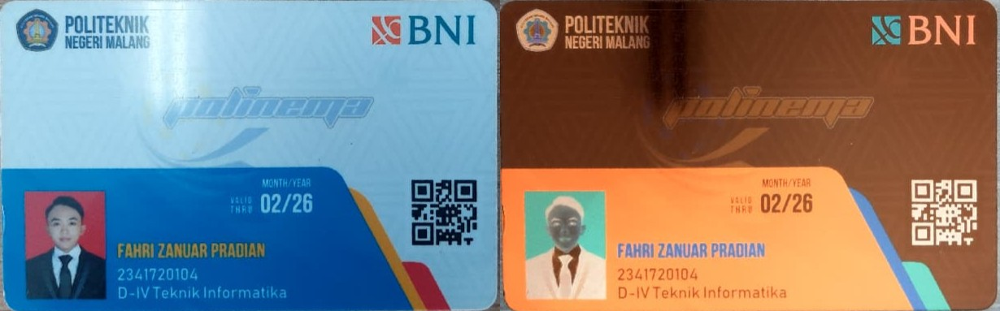

Versi simpel tanpa loop
--------------------------------------


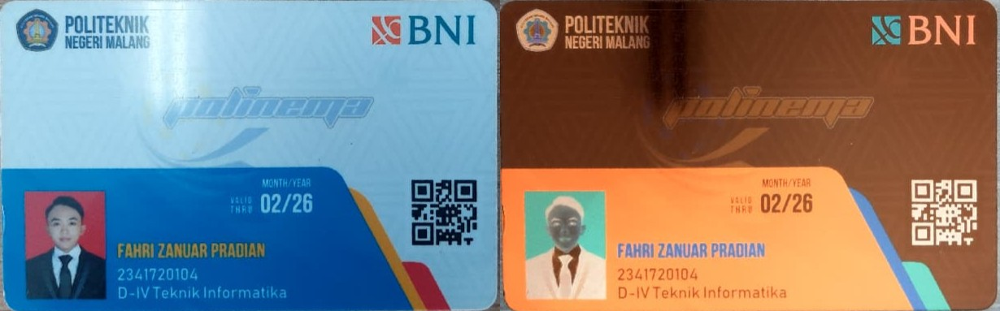

In [7]:
# Buat inverse image dengan loop
inverse_image = np.zeros(ktm_lampu.shape, ktm_lampu.dtype)

for y in range(ktm_lampu.shape[0]):
    for x in range(ktm_lampu.shape[1]):
        for c in range(ktm_lampu.shape[2]):
            # formula inverse: g(x) = 255 - f(x)
            inverse_image[y, x, c] = 255 - ktm_lampu[y, x, c]

# Gabungkan gambar asli dan inverse
combined_image = cv2.hconcat((ktm_lampu, inverse_image))
cv2_imshow(combined_image)


# Versi simpel tanpa loop
print('Versi simpel tanpa loop')
print('--------------------------------------')
inverse_image_simple = cv2.bitwise_not(ktm_lampu)
combined_image_simple = cv2.hconcat((ktm_lampu, inverse_image_simple))
cv2_imshow(combined_image_simple)


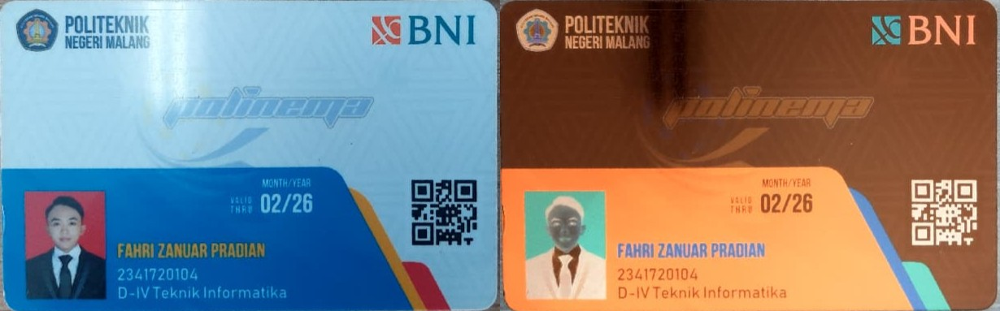

In [8]:
if ktm_lampu is None:
    print(f"Error: Gambar tidak ditemukan di path: {image_path}")
else:
    # Buat salinan gambar untuk menyimpan hasil inverse
    inverse_image = np.zeros(ktm_lampu.shape, ktm_lampu.dtype)

    # Terapkan formula inverse: g(x) = 255 - f(x)
    for y in range(ktm_lampu.shape[0]):
        for x in range(ktm_lampu.shape[1]):
            for c in range(ktm_lampu.shape[2]):
                inverse_image[y, x, c] = 255 - ktm_lampu[y, x, c]

    # Gabungkan kedua gambar (asli dan inverse)
    combined_image = cv2.hconcat((ktm_lampu, inverse_image))

    # Tampilkan hasilnya
    cv2_imshow(combined_image)

Mengubah tingkat kontras dan kecerahan citra
------------------------------------------
Masukkan nilai alpha (faktor kontras, 1.0 - 3.0): 2
Masukkan nilai beta (tingkat kecerahan, contoh: -255 - 255): 50


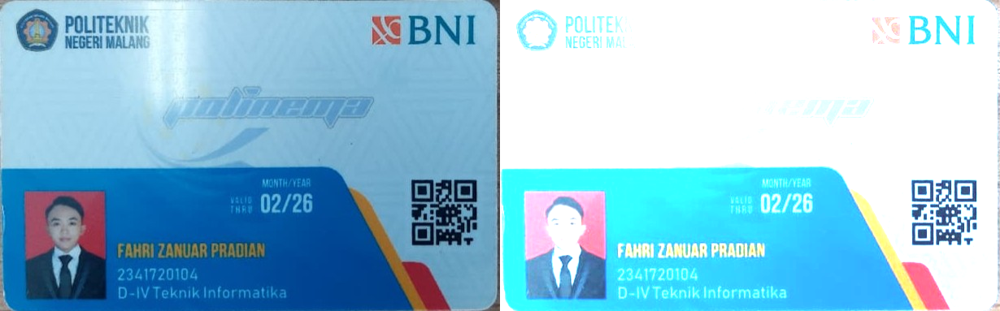

Versi dengan simple mengunakan convertscaleabs


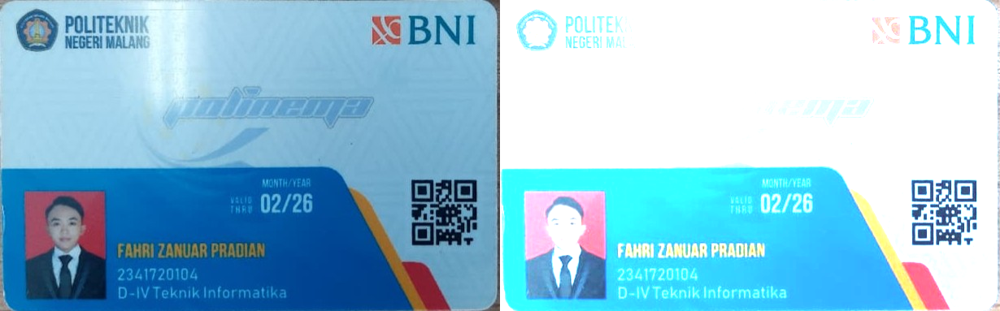

In [9]:
print('Mengubah tingkat kontras dan kecerahan citra')
print('------------------------------------------')

alpha = float(input('Masukkan nilai alpha (faktor kontras, 1.0 - 3.0): '))
beta = int(input('Masukkan nilai beta (tingkat kecerahan, contoh: -255 - 255): '))

# Membaca gambar
original_image = ktm_lampu.copy()

final_image = np.zeros(original_image.shape, original_image.dtype)

# Terapkan transformasi gabungan per piksel
# Formula: g(x,y) = alpha * f(x,y) + beta
for y in range(original_image.shape[0]):
    for x in range(original_image.shape[1]):
        for c in range(original_image.shape[2]):
            # Terapkan rumus dan gunakan np.clip untuk menjaga nilai di antara 0 dan 255
            final_image[y, x, c] = np.clip(alpha * original_image[y, x, c] + beta, 0, 255)

# Gabungkan gambar asli dan gambar yang sudah diubah
combined_image = cv2.hconcat((original_image, final_image))

# Tampilkan hasilnya
cv2_imshow(combined_image)

print('Versi dengan simple mengunakan convertscaleabs')
# Transformasi Gabungan: g(x,y) = alpha * f(x,y) + beta
final_image = cv2.convertScaleAbs(original_image, alpha=alpha, beta=beta)

# Gabungkan gambar asli dan gambar yang sudah diubah
combined_image = cv2.hconcat((original_image, final_image))

# Tampilkan hasilnya
cv2_imshow(combined_image)


 Mengubah tingkat kecerahan dengan transformasi log 
----------------------------------
Masukkan nilai kecerahan [ -255, 255 ] :50


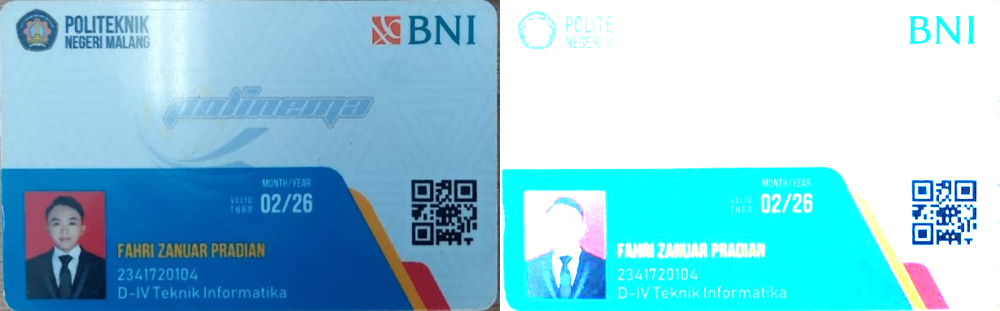

In [10]:
print(' Mengubah tingkat kecerahan dengan transformasi log ')
print("----------------------------------")

try:
  brightness = int(input('Masukkan nilai kecerahan [ -255, 255 ] :'))
except ValueError:
  print("Error, not a number")

original = ktm_lampu.copy()
brightness_image = np.zeros(original.shape, original.dtype)
brightness_image_contrast = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(np.max(original[y, x, c]) * np.log(1+brightness), 0, 255)

#cara simple tanpa for loop
# brightness_image = cv2.convertScaleAbs(original, beta=brightness)

final_frame = cv2.hconcat((original, brightness_image))
cv2_imshow(final_frame)

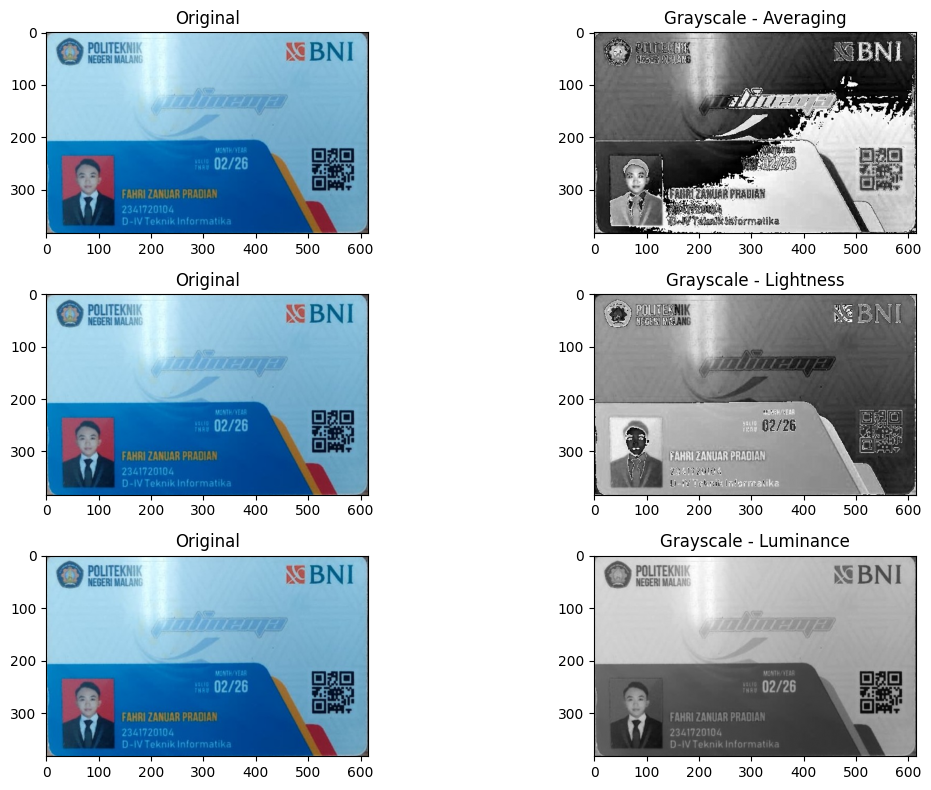

In [13]:
ktm = ktm_lampu.copy()
image = cv2.cvtColor(ktm, cv2.COLOR_BGR2RGB)  # konversi ke RGB untuk matplotlib


# Ambil channel R, G, B
R = image[:, :, 0]
G = image[:, :, 1]
B = image[:, :, 2]

# 1. Grayscale Averaging
gray_avg = ((R + G + B) / 3).astype(np.uint8)

# 2. Grayscale Lightness
gray_light = ((np.maximum(np.maximum(R, G), B) + np.minimum(np.minimum(R, G), B)) / 2).astype(np.uint8)

# 3. Grayscale Luminance (Luminosity)
gray_lum = (0.21 * R + 0.72 * G + 0.07 * B).astype(np.uint8)

# Tampilkan hasil
plt.figure(figsize=(12, 8))

# Averaging
plt.subplot(3, 2, 1)
plt.imshow(image)
plt.title("Original")

plt.subplot(3, 2, 2)
plt.imshow(gray_avg, cmap='gray')
plt.title("Grayscale - Averaging")

# Lightness
plt.subplot(3, 2, 3)
plt.imshow(image)
plt.title("Original")

plt.subplot(3, 2, 4)
plt.imshow(gray_light, cmap='gray')
plt.title("Grayscale - Lightness")

# Luminance
plt.subplot(3, 2, 5)
plt.imshow(image)
plt.title("Original")

plt.subplot(3, 2, 6)
plt.imshow(gray_lum, cmap='gray')
plt.title("Grayscale - Luminance")

plt.tight_layout()
plt.show()


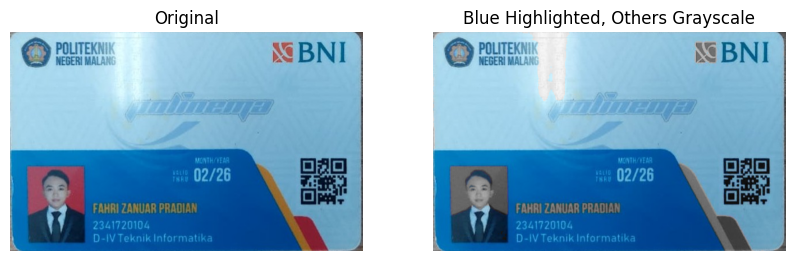

In [19]:
ktm = ktm_lampu.copy()

# Konversi ke HSV (lebih gampang untuk filter warna)
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Range warna biru (dalam HSV)
lower_blue = np.array([90, 50, 50])    # batas bawah
upper_blue = np.array([130, 255, 255]) # batas atas

# Masking area biru
mask = cv2.inRange(hsv, lower_blue, upper_blue)

# Buat versi grayscale dari citra
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray_rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

# Gabungkan: area biru pakai warna asli, sisanya grayscale
result = np.where(mask[:, :, None] != 0, image, gray_rgb)

# --- Konversi BGR -> RGB untuk ditampilkan di matplotlib ---
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

# Tampilkan hasil
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result_rgb)
plt.title("Blue Highlighted, Others Grayscale")
plt.axis("off")

plt.show()


 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


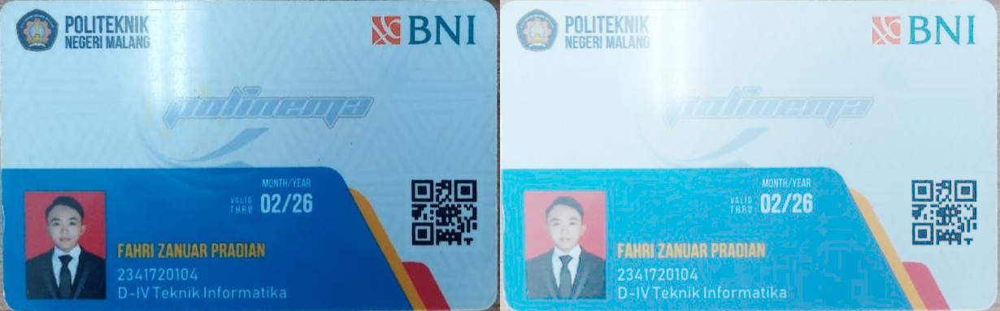

In [20]:

print(' Gamma Correction pada citra ')
print('----------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

image = ktm_lampu.copy()

# Normalisasi ke [0,1]
normalized = image / 255.0

# Terapkan rumus gamma correction
gamma_corrected = np.power(normalized, 1.0 / gamma)

# Kembalikan ke [0,255] dan uint8
gamma_corrected_uint8 = np.uint8(gamma_corrected * 255)

# Gabungkan citra asli dan hasil gamma correction
combined = cv2.hconcat([image, gamma_corrected_uint8])

# Tampilkan hasil
cv2_imshow(combined)


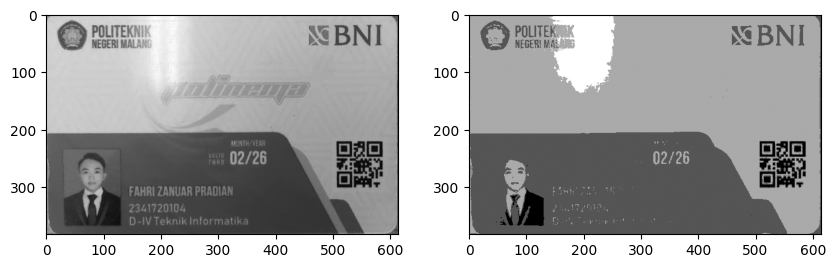

In [33]:
# Tentukan kedalaman bit
bit_depth = 2
level = 255 / (pow(2, bit_depth) - 1)

# Baca gambar grayscale
original = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/ktm lampu.jpg', cv.IMREAD_GRAYSCALE)

# Siapkan citra keluaran
depth_image = np.zeros(original.shape, original.dtype)

# Lakukan kuantisasi sesuai rumus
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        depth_image[y, x] = int(np.round(original[y, x] / level) * level)

# Versi efisien (tanpa loop)
# depth_image = (np.round(original / level) * level).astype(np.uint8)

# Tampilkan hasil
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(original, cmap='gray')

plt.subplot(1,2,2)
plt.imshow(depth_image, cmap='gray')

plt.show()


Jumlah citra noisy terbaca: 100
Average 10 citra → PSNR = 27.54 dB
Average 20 citra → PSNR = 27.51 dB
Average 40 citra → PSNR = 27.46 dB
Average 80 citra → PSNR = 27.40 dB
Average 100 citra → PSNR = 27.37 dB


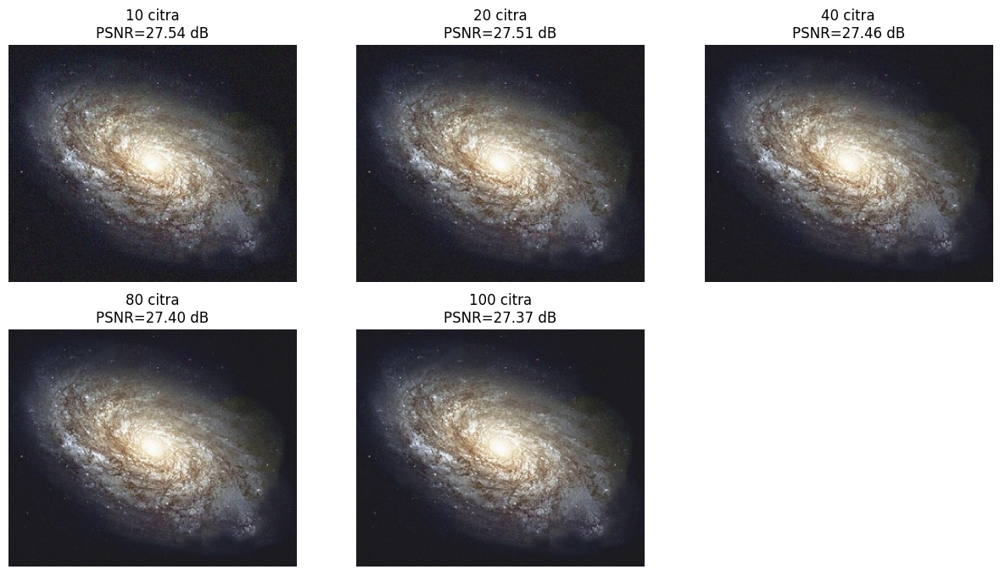

   Jumlah Citra  PSNR (dB)
0            10      27.54
1            20      27.51
2            40      27.46
3            80      27.40
4           100      27.37


In [35]:
import cv2 as cv
import numpy as np
import glob
from math import log10, sqrt
import matplotlib.pyplot as plt
import pandas as pd

# --- Fungsi PSNR ---
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / np.sqrt(mse))
    return psnr

# --- Load gambar asli ---
original = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/galaxy.jpg')

# --- Load 100 gambar noisy ---
cv_img = []
for img in sorted(glob.glob('/content/drive/MyDrive/Colab Notebooks/PCVK/images/noises/*.jpg')):
    n = cv.imread(img)
    cv_img.append(n)

print("Jumlah citra noisy terbaca:", len(cv_img))  # harusnya 100

# --- Fungsi average denoising ---
def average_denoising(images, n):
    avg = np.zeros_like(images[0], np.float32)
    for i in range(n):
        avg += images[i].astype(np.float32)
    avg /= n
    return avg.astype(np.uint8)

# --- Uji untuk jumlah citra tertentu ---
counts = [10, 20, 40, 80, 100]
results = []

for c in counts:
    denoised = average_denoising(cv_img, c)
    psnr_value = PSNR(original, denoised)
    results.append([c, denoised, psnr_value])
    print(f"Average {c} citra → PSNR = {psnr_value:.2f} dB")

# --- Visualisasi hasil ---
plt.figure(figsize=(15,8))
for i, (c, denoised, psnr_value) in enumerate(results):
    plt.subplot(2,3,i+1)
    plt.imshow(cv.cvtColor(denoised, cv.COLOR_BGR2RGB))
    plt.title(f"{c} citra\nPSNR={psnr_value:.2f} dB")
    plt.axis("off")
plt.show()

# --- Simpan ke tabel DataFrame ---
data = {"Jumlah Citra": [r[0] for r in results],
        "PSNR (dB)": [round(r[2], 2) for r in results]}
df = pd.DataFrame(data)
print(df)


Dari hasil perhitungan PSNR pada proses average denoising, dapat disimpulkan bahwa semakin banyak jumlah citra noisy yang digunakan dalam proses perataan (averaging), maka kualitas citra hasil akan semakin baik. Hal ini ditunjukkan oleh nilai PSNR yang meningkat seiring dengan bertambahnya jumlah citra yang di-average. Semakin tinggi nilai PSNR, semakin kecil perbedaan citra hasil dengan citra asli, sehingga citra tampak lebih jelas dan noise berkurang secara signifikan. Dengan demikian, metode average denoising efektif digunakan untuk mengurangi noise acak pada citra digital.

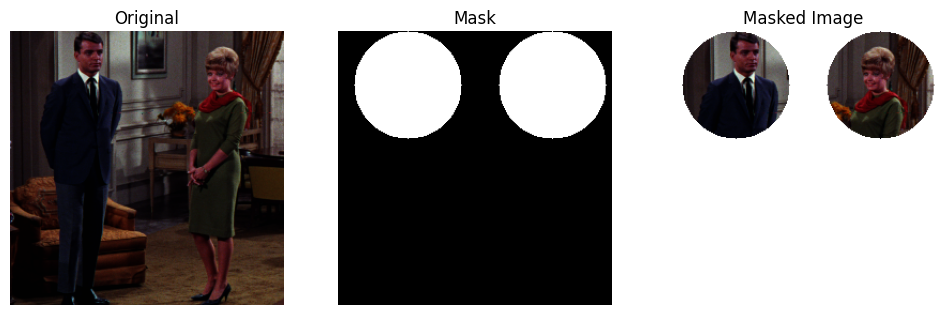

In [45]:

# Baca gambar asli
img = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/couple.tiff')

# Buat mask hitam dengan ukuran sama
mask = np.zeros(img.shape[:2], dtype="uint8")

# Tambah lingkaran putih pada mask
cv.circle(mask, (65, 50), 50, 255, -1)   # lingkaran pertama
cv.circle(mask, (200, 50), 50, 255, -1)   # lingkaran kedua

# Terapkan masking (bitwise AND)
masked = cv.bitwise_and(img, img, mask=mask)
# Buat background putih
white_bg = np.ones_like(img, dtype=np.uint8) * 255

# Gabungkan: jika mask = 0 → ambil dari putih, jika mask = 1 → ambil dari gambar
masked_white = np.where(mask[:, :, None] == 0, white_bg, masked)

# Tampilkan hasil
plt.figure(figsize=(12,5))
plt.subplot(1,3,1)
plt.title("Original")
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Mask")
plt.imshow(mask, cmap="gray")
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Masked Image")
plt.imshow(cv.cvtColor(masked_white, cv.COLOR_BGR2RGB))
plt.axis("off")

plt.show()


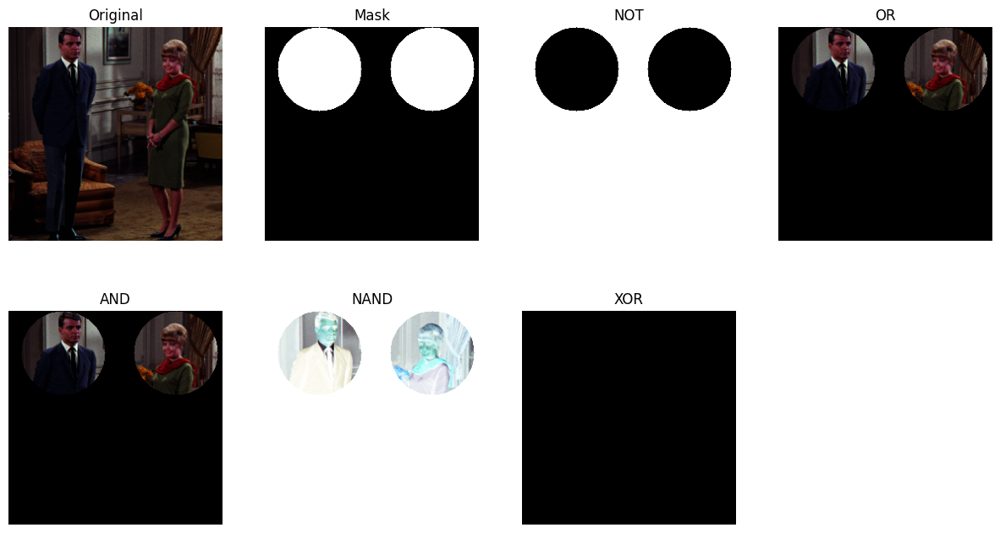

In [47]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Baca gambar asli
img = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/couple.tiff')

# Buat mask hitam dengan dua lingkaran putih
mask = np.zeros(img.shape[:2], dtype="uint8")
cv.circle(mask, (65, 50), 50, 255, -1)   # lingkaran pertama
cv.circle(mask, (200, 50), 50, 255, -1)

# --- Operator ---
not_mask = cv.bitwise_not(mask)                   # NOT
or_mask = cv.bitwise_or(img, img, mask=mask)      # OR
and_mask = cv.bitwise_and(img, img, mask=mask)    # AND
nand_mask = cv.bitwise_not(and_mask)              # NAND
xor_mask = cv.bitwise_xor(img, img, mask=mask)    # XOR

# --- Visualisasi ---
titles = ["Original", "Mask", "NOT", "OR", "AND", "NAND", "XOR"]
images = [img, mask, not_mask, or_mask, and_mask, nand_mask, xor_mask]

plt.figure(figsize=(15,8))
for i in range(len(images)):
    plt.subplot(2,4,i+1)
    if len(images[i].shape) == 2:  # grayscale
        plt.imshow(images[i], cmap="gray")
    else:
        plt.imshow(cv.cvtColor(images[i], cv.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis("off")
plt.show()


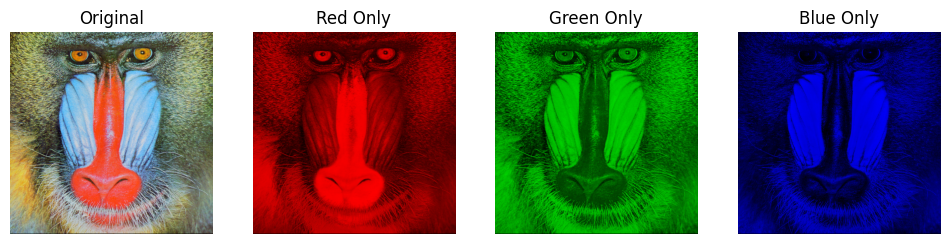

In [48]:
# Baca gambar
img = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/mandrill.tiff')

# Pisahkan channel B, G, R
b, g, r = cv.split(img)

# Buat gambar channel-only
zeros = cv.merge([np.zeros_like(b), np.zeros_like(g), np.zeros_like(r)])  # gambar hitam
red_only   = cv.merge([zeros[:,:,0], zeros[:,:,1], r])  # hanya channel R
green_only = cv.merge([zeros[:,:,0], g, zeros[:,:,2]])  # hanya channel G
blue_only  = cv.merge([b, zeros[:,:,1], zeros[:,:,2]])  # hanya channel B

# Tampilkan hasil
plt.figure(figsize=(12,5))
plt.subplot(1,4,1)
plt.title("Original")
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(1,4,2)
plt.title("Red Only")
plt.imshow(cv.cvtColor(red_only, cv.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(1,4,3)
plt.title("Green Only")
plt.imshow(cv.cvtColor(green_only, cv.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(1,4,4)
plt.title("Blue Only")
plt.imshow(cv.cvtColor(blue_only, cv.COLOR_BGR2RGB))
plt.axis("off")

plt.show()


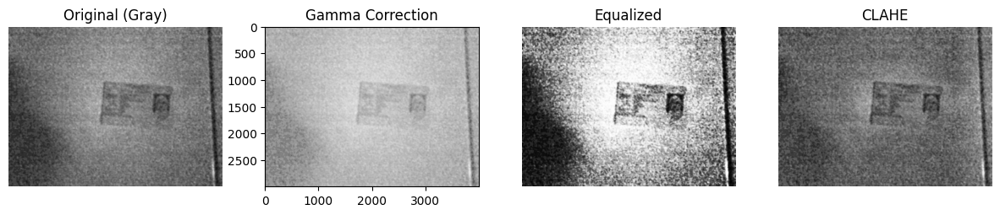

In [53]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# Baca gambar
img = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/Salinan KTPX.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# --- Gamma Correction ---
gamma = 2.5   # semakin besar, semakin terang
gamma_corrected = np.array(255 * (gray / 255) ** (1/gamma), dtype='uint8')

# --- Histogram Equalization ---
equalized = cv.equalizeHist(gray)

# --- CLAHE ---
clahe = cv.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)

# --- Tampilkan hasil ---
plt.figure(figsize=(15,6))
plt.subplot(1,4,1)
plt.title("Original (Gray)")
plt.imshow(gray, cmap='gray')
plt.axis("off")

plt.subplot(1,4,2)
plt.title("Gamma Correction")
plt.imshow(gamma_corrected, cmap='gray')
# plt.axis("off")

plt.subplot(1,4,3)
plt.title("Equalized")
plt.imshow(equalized, cmap='gray')
plt.axis("off")

plt.subplot(1,4,4)
plt.title("CLAHE")
plt.imshow(clahe_img, cmap='gray')
plt.axis("off")

plt.show()


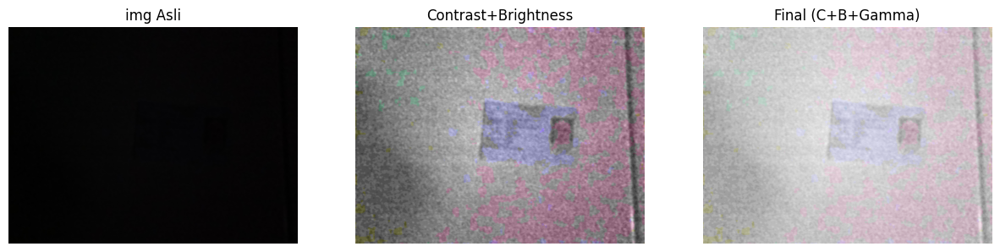

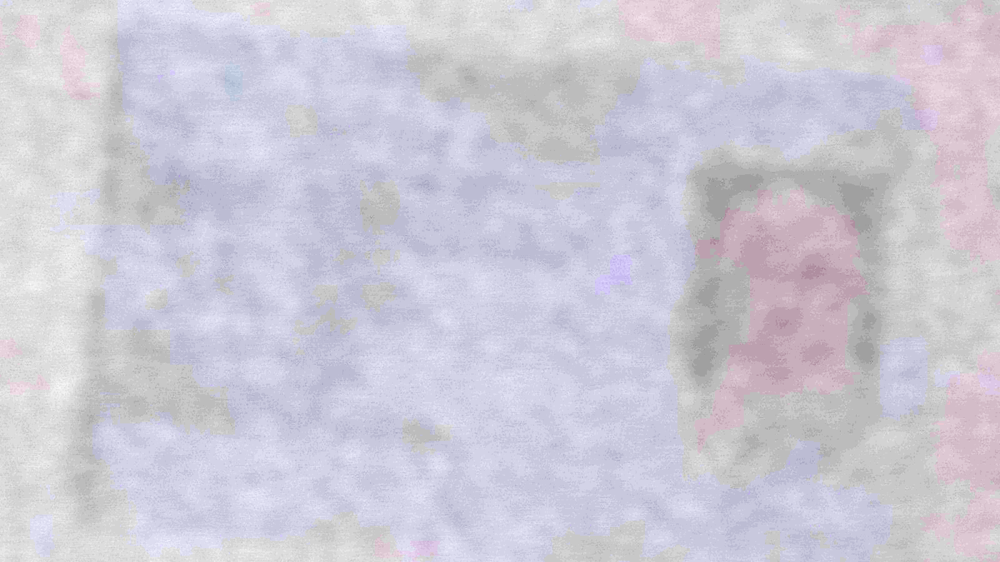

In [110]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# --- Baca  ---
img = cv.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/images/Salinan KTPX.jpg')

# --- 1. Brightness & Contrast ---
alpha = 20  # >1 memperkuat kontras
beta  = 40    # nilai positif mencerahkan
contrast_bright = cv.convertScaleAbs(img, alpha=alpha, beta=beta)

# --- 2. Gamma Correction ---
gamma = 2.5   # coba nilai 2.0–3.5
gamma_corrected = np.array(255 * (contrast_bright / 255) ** (1/gamma), dtype='uint8')

# --- Tampilkan ---
plt.figure(figsize=(15,6))
plt.subplot(1,3,1); plt.title("img Asli"); plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)); plt.axis("off")
plt.subplot(1,3,2); plt.title("Contrast+Brightness"); plt.imshow(cv.cvtColor(contrast_bright, cv.COLOR_BGR2RGB)); plt.axis("off")
plt.subplot(1,3,3); plt.title("Final (C+B+Gamma)"); plt.imshow(cv.cvtColor(gamma_corrected, cv.COLOR_BGR2RGB)); plt.axis("off")
plt.show()

crop = gamma_corrected[1000:1900, 1600:3200]
cv2_imshow(crop)
plt.show()

